In [1]:
import pyswarms as ps
#import psopy
import math
import pandas as pd
import numpy as np
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401 unused import
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
import numpy as np


In [2]:

# Import modules
import numpy as np

# Import sphere function as objective function

# Import backend modules
import pyswarms.backend as P
from pyswarms.backend.topology import Star

import pyswarms as ps
from pyswarms.utils.functions import single_obj as fx
from pyswarms.utils.plotters import plot_cost_history, plot_contour, plot_surface
import matplotlib.pyplot as plt
from pyswarms.utils.plotters.formatters import Mesher, Designer

# Some more magic so that the notebook will reload external python modules;
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 22])

# Datframe

In [3]:
df = pd.read_csv('data/icr-nliq-computer-science.csv')
#df = pd.read_csv('/Users/poulamisarkar/Documents/Research/Chaos-in-production-economics/result/result_0.101TO0.9.csv')
df = df.fillna(0)
df['ICR'] = df['ICR'].replace(0,0.01)
df

,Institute,Articles,Articles w/ IC,Total Citations,Parent Country Citations,ICR,NLIQ,Ranking
0,Yale University,139,38,2698,1122,0.447413,0.584136,8
1,Brown University,113,32,2381,1027,0.487884,0.568669,53
2,Boston University,135,37,4170,1740,0.490636,0.582734,61
3,University of Groningen,108,31,1901,308,0.490845,0.837980,73
4,Humboldt University of Berlin,113,29,2930,697,0.590844,0.762116,74
...,...,...,...,...,...,...,...,...
70,University of Baghdad,8,2,341,15,0.473333,0.956012,801-1000
71,Hanoi University of Science & Technology,15,10,160,8,0.683347,0.950000,801-1000
72,University of Puerto Rico,16,10,668,161,0.441312,0.758982,801-1000
73,Atilim University,31,6,416,85,0.638889,0.795673,801-1000


# CES function

In [4]:
class Q:
    def setparams(self,alpha=0.5,eta=1,K=0.306173,L=0.388889):
        self.K = K
        self.L = L
        self.alpha = alpha
        self.eta = eta
        
    def Q(self,rho):
        q1 = (self.alpha * self.K**rho) + (1 - self.alpha)*(self.L**rho)
        q = q1 ** (self.eta/rho)
        return q

    def Q1(self,rho):
        q = self.Q(rho)
        if (self.K**self.alpha)*(self.L**(1-self.alpha)) == 0:
            return 0
        q1_1 = q ** (-rho/self.eta) * math.log( (self.K**self.alpha)*(self.L**(1-self.alpha)) )
        if q == 0:
            return 0
        q1 = q1_1 / math.log(q)
        return q1
    
    def Q1_new(self,rho):
        r = (self.alpha * self.K**rho) + (1 - self.alpha)*(self.L**rho)
        q1 = self.K**(self.alpha*self.K**rho) * self.L**((1-self.alpha)*self.L**rho)
        res = ( (self.Q(rho)*self.eta) / (r*rho) ) * math.log(q1/(r**(r/rho)))
        return res
        
q =Q()
q.setparams(K=0.3061728395, L=0.38888888899999996,alpha=0.1)
def f(x):
    l,r = x.shape
    F = []
    for i in range(l):
        temp = []
        for j in range(r):
            #t = x[i][j]*math.sin(math.pi*x[i][j]*10)+1.0
            t = q.Q(x[i][j]) 
            #temp.append(t)
        F.append(t)
    #print(F)
    return np.array(F)

In [34]:
q.Q(0.10114881)

0.37979738702115545

# PSO optimization using inbuilt pySwarm

2021-04-01 00:17:49,788 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best:  56%|█████▌    |56/100, best_cost=0.511

0.3061728395 0.38888888899999996


pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.511
2021-04-01 00:17:49,981 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.5112247175620733, best pos: [4.80890993e-05]


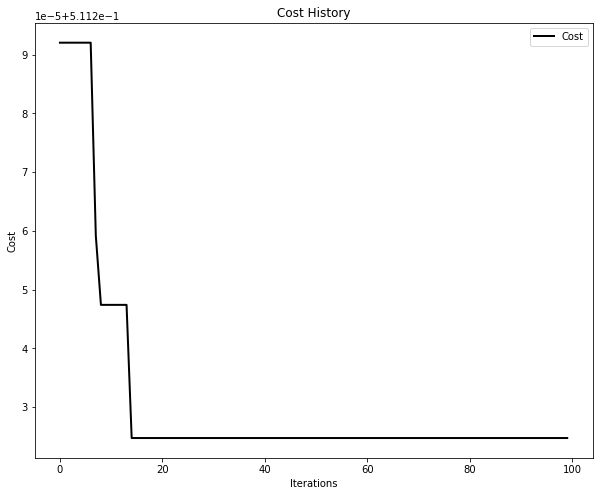

In [35]:
print(q.K,q.L)
q.setparams(K=df['ICR'][0],L=df['NLIQ'][0],alpha=0.5)
max_bound = 1.0 * np.ones(1)
min_bound = 0.0 * np.ones(1)
bounds = (min_bound, max_bound)
# Set-up optimizer
options = {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
optimizer = ps.single.GlobalBestPSO(n_particles=25, dimensions=1, options=options, bounds=bounds)
optimizer.optimize(f, iters=100)
# Plot the cost
plot_cost_history(optimizer.cost_history)
plt.savefig('cost.png')
plt.show()


RuntimeError: Requested MovieWriter (ffmpeg) not available

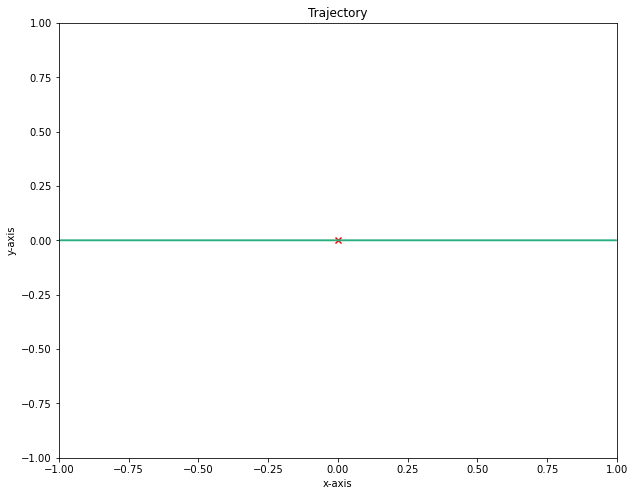

In [24]:
from IPython.display import HTML
%matplotlib inline
import matplotlib.animation# Plot the sphere function's mesh for better plots
m = Mesher(func=f)
# Adjust figure limits
d = Designer(
    #limits=[(-1,1), (-1,1), (-0.1,1)],
             label=['x-axis', 'y-axis', 'z-axis'])

animation2d = plot_contour(pos_history=optimizer.pos_history,
                         mesher=m,
                         mark=(0,0))

# Enables us to view it in a Jupyter notebook
HTML(animation2d.to_html5_video())

In [ ]:
pos_history_3d = m.compute_history_3d(optimizer.pos_history)

from pyswarms.utils.plotters.formatters import Designer
d = Designer(label=['x-axis', 'y-axis', 'z-axis'])

# Make animation
animation3d = plot_surface(pos_history=pos_history_3d, # Use the cost_history we computed
                           mesher=m, designer=d,       # Customizations
                           mark=(0,0,0))               # Mark minima

# Enables us to view it in a Jupyter notebook
HTML(animation3d.to_html5_video())

# Cost for each datapoint

In [36]:
def PSO(max_b,min_b,c1,c2,w,alpha):
    # Set constraints and options Internationality(rho>1)
    max_bound = max_b * np.ones(1)
    min_bound = min_b * np.ones(1)
    bounds = (min_bound,max_bound)
    options = {'c1': c1, 'c2': c2, 'w': w}
    print(bounds)

    costs = []
    positions = []
    K =[]
    L=[]
    for d in range(len(df))[:]:
        q.setparams(K=df['ICR'][d],L=df['NLIQ'][d],alpha=alpha)
        print(q.K,q.L)

        # Set-up optimizer
        optimizer = ps.single.GlobalBestPSO(n_particles=25, dimensions=1, options=options,bounds =bounds)
        cost,pos = optimizer.optimize(f, iters=100)
        
        # Plotting 2D and 3D cost history
        # 2Dplot
        plot_cost_history(optimizer.cost_history)
        #plt.savefig('cost_history/2D/'+str(max_b)+'>rho>'+str(min_b)+'/cost_2D_'+df['Institute'][d]+'.png')
        
        #3D plot
        m = Mesher(func=f,limits=[(-1,1), (-1,1)])
        # Adjust figure limits
        des = Designer(limits=[(-1,1), (-1,1), (-0.1,1)],label=['x-axis', 'y-axis', 'z-axis'])
        pos_history_3d = m.compute_history_3d(optimizer.pos_history) # preprocessing
        animation3d = plot_surface(pos_history=pos_history_3d,
                                   mesher=m, designer=des,
                                   mark=(0,0,0))   
        #plt.savefig('cost_history/3D/'+str(max_b)+'>rho>'+str(min_b)+'/cost_3D_'+df['Institute'][d]+'.png')

        # Print and return cost and internationality score
        print('Cost: %f\nPosition%f'%(cost,pos))

        costs.append(cost)
        positions.append(pos[0])
    return costs,positions

2021-04-01 00:18:43,255 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.569
2021-04-01 00:18:43,400 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.5689507708028098, best pos: [0.10216854]


(array([0.101]), array([0.9]))
0.4474134631 0.5841363973


2021-04-01 00:18:56,231 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.56
2021-04-01 00:18:56,370 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.5600815247540607, best pos: [0.10123767]


Cost: 0.568951
Position0.102169
0.4878838931 0.5686686266


2021-04-01 00:19:09,052 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.573
2021-04-01 00:19:09,197 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.5728718732358107, best pos: [0.10137772]


Cost: 0.560082
Position0.101238
0.49063601869999995 0.5827338129


2021-04-01 00:19:22,666 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.795
2021-04-01 00:19:22,823 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.7953576107004302, best pos: [0.10119927]


Cost: 0.572872
Position0.101378
0.49084515310000004 0.8379800104999999


2021-04-01 00:19:37,849 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.743
2021-04-01 00:19:37,951 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.7431792756035882, best pos: [0.10125496]


Cost: 0.795358
Position0.101199
0.5908436531 0.762116041


2021-04-01 00:19:55,525 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.56
2021-04-01 00:19:55,627 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.5598241277563861, best pos: [0.10290706]


Cost: 0.743179
Position0.101255
0.5554567900999999 0.560311284


2021-04-01 00:20:09,031 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.698
2021-04-01 00:20:09,136 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.6982328999987998, best pos: [0.10115867]


Cost: 0.559824
Position0.102907
0.4646057237 0.7298187809000001


2021-04-01 00:20:22,118 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.832
2021-04-01 00:20:22,264 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.8321387466305479, best pos: [0.10144758]


Cost: 0.698233
Position0.101159
0.5716947328 0.8668280872


2021-04-01 00:20:35,489 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.598
2021-04-01 00:20:35,594 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.5976802547764488, best pos: [0.10108112]


Cost: 0.832139
Position0.101448
0.5074962699000001 0.6085409253


2021-04-01 00:20:48,777 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.751
2021-04-01 00:20:48,896 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.7509647149874114, best pos: [0.10152288]


Cost: 0.597680
Position0.101081
0.4037449775 0.8026819923


2021-04-01 00:21:02,368 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.664
2021-04-01 00:21:02,473 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.6637036343693049, best pos: [0.1015029]


Cost: 0.750965
Position0.101523
0.4722488996 0.6887886598


/Users/poulamisarkar/opt/anaconda3/envs/work/lib/python3.8/site-packages/pyswarms/utils/plotters/plotters.py:122: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  _, ax = plt.subplots(1, 1, figsize=designer.figsize)
2021-04-01 00:21:15,594 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.835
2021-04-01 00:21:15,704 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.8354347935647378, best pos: [0.10112863]


Cost: 0.663704
Position0.101503
0.5642211965 0.871850252


2021-04-01 00:21:29,073 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.546
2021-04-01 00:21:29,219 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.5462240181584564, best pos: [0.10110237]


Cost: 0.835435
Position0.101129
0.5377777778 0.5471698113


2021-04-01 00:21:42,718 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.869
2021-04-01 00:21:42,822 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.8689454711924737, best pos: [0.10142557]


Cost: 0.546224
Position0.101102
0.484691615 0.9252465483


2021-04-01 00:21:55,801 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.799
2021-04-01 00:21:55,933 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.7992797908553285, best pos: [0.10159371]


Cost: 0.868945
Position0.101426
0.46719743700000005 0.8469184891


2021-04-01 00:22:09,429 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.794
2021-04-01 00:22:09,530 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.7940332906935483, best pos: [0.10178769]


Cost: 0.799280
Position0.101594
0.5684712516 0.8235002479000001


2021-04-01 00:22:22,490 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.803
2021-04-01 00:22:22,654 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.8028108081235815, best pos: [0.10103036]


Cost: 0.794033
Position0.101788
0.4775185428 0.8491155047


2021-04-01 00:22:35,702 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.548
2021-04-01 00:22:35,802 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.547594822543741, best pos: [0.1010773]


Cost: 0.802811
Position0.101030
0.4958996212 0.5536277603


2021-04-01 00:22:48,945 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.703
2021-04-01 00:22:49,043 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.703144441587781, best pos: [0.10146553]


Cost: 0.547595
Position0.101077
0.3608238379 0.7551978537999999


2021-04-01 00:23:01,926 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.813
2021-04-01 00:23:02,094 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.8128102426635372, best pos: [0.10142621]


Cost: 0.703144
Position0.101466
0.5157405860000001 0.8538622129000001


2021-04-01 00:23:15,497 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.764
2021-04-01 00:23:15,666 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.7642162864253785, best pos: [0.10102424]


Cost: 0.812810
Position0.101426
0.42329532659999997 0.8143322476


2021-04-01 00:23:29,181 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.771
2021-04-01 00:23:29,310 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.7713081272638457, best pos: [0.10126983]


Cost: 0.764216
Position0.101024
0.40955964170000003 0.8254931715


2021-04-01 00:23:42,818 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.734
2021-04-01 00:23:42,924 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.734350248875228, best pos: [0.10166737]


Cost: 0.771308
Position0.101270
0.5371087992 0.7598597720999999


2021-04-01 00:23:56,144 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.799
2021-04-01 00:23:56,249 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.7988397734982754, best pos: [0.10113483]


Cost: 0.734350
Position0.101667
0.5835490372 0.8267026298000001


2021-04-01 00:24:09,213 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.791
2021-04-01 00:24:09,326 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.7910675693558697, best pos: [0.10114883]


Cost: 0.798840
Position0.101135
0.4701238462 0.8367697595


2021-04-01 00:24:22,424 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.601
2021-04-01 00:24:22,549 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.6005180173614232, best pos: [0.10204422]


Cost: 0.791068
Position0.101149
0.3145422354 0.6436018957


2021-04-01 00:24:35,189 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.691
2021-04-01 00:24:35,310 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.691392637079754, best pos: [0.10125859]


Cost: 0.600518
Position0.102044
0.4455561717 0.7251243781000001


2021-04-01 00:24:48,191 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.827
2021-04-01 00:24:48,295 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.8274104598726513, best pos: [0.10120561]


Cost: 0.691393
Position0.101259
0.38349147009999995 0.8979938796


2021-04-01 00:25:01,217 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.733
2021-04-01 00:25:01,321 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.7327236570103022, best pos: [0.10129226]


Cost: 0.827410
Position0.101206
0.4255073871 0.7769296014


2021-04-01 00:25:14,304 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.801
2021-04-01 00:25:14,453 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.8012452924150993, best pos: [0.10192695]


Cost: 0.732724
Position0.101292
0.5006676309 0.8430698740000001


2021-04-01 00:25:26,957 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.727
2021-04-01 00:25:27,058 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.7270882854155908, best pos: [0.10142717]


Cost: 0.801245
Position0.101927
0.4589029431 0.7642393654999999


2021-04-01 00:25:39,734 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.743
2021-04-01 00:25:39,841 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.743157929392788, best pos: [0.10121894]


Cost: 0.727088
Position0.101427
0.5244270833 0.7719298245999999


2021-04-01 00:25:52,922 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.638
2021-04-01 00:25:53,023 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.6383780800800448, best pos: [0.1017533]


Cost: 0.743158
Position0.101219
0.2612172147 0.7016129031999999


2021-04-01 00:26:06,364 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.837
2021-04-01 00:26:06,466 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.8374685755484401, best pos: [0.10163429]


Cost: 0.638378
Position0.101753
0.49730607229999996 0.8859180036


2021-04-01 00:26:20,138 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.71
2021-04-01 00:26:20,253 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.7101843252305097, best pos: [0.10115187]


Cost: 0.837469
Position0.101634
0.4525512614 0.7457191781


2021-04-01 00:26:33,889 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.739
2021-04-01 00:26:33,990 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.7392296399536145, best pos: [0.10132843]


Cost: 0.710184
Position0.101152
0.5012996778000001 0.7711138311


2021-04-01 00:26:48,074 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.746
2021-04-01 00:26:48,231 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.7455287897997158, best pos: [0.10107349]


Cost: 0.739230
Position0.101328
0.5473674968 0.7711138311


2021-04-01 00:27:02,286 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.569
2021-04-01 00:27:02,385 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.5694352935330912, best pos: [0.1011678]


Cost: 0.745529
Position0.101073
0.2899114386 0.6120930232999999


2021-04-01 00:27:15,318 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.651
2021-04-01 00:27:15,442 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.6513880769876254, best pos: [0.1010302]


Cost: 0.569435
Position0.101168
0.3727200255 0.6917582418000001


2021-04-01 00:27:28,391 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.865
2021-04-01 00:27:28,499 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.8645541019668864, best pos: [0.1011707]


Cost: 0.651388
Position0.101030
0.39546296299999995 0.9395672718000001


2021-04-01 00:27:40,736 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.626
2021-04-01 00:27:40,843 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.6261091391338277, best pos: [0.10243661]


Cost: 0.864554
Position0.101171
0.5387255164 0.6365638767


2021-04-01 00:27:53,783 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.867
2021-04-01 00:27:53,910 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.8666694546221653, best pos: [0.10126212]


Cost: 0.626109
Position0.102437
0.6153211285 0.8996372429999999


2021-04-01 00:28:08,017 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.785
2021-04-01 00:28:08,145 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.785234029673328, best pos: [0.10111116]


Cost: 0.866669
Position0.101262
0.47998285890000003 0.8281481481


2021-04-01 00:28:21,638 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.756
2021-04-01 00:28:21,767 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.7557334067273632, best pos: [0.10113824]


Cost: 0.785234
Position0.101111
0.46093694890000003 0.7972190035


2021-04-01 00:28:35,577 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.713
2021-04-01 00:28:35,679 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.7127245103049274, best pos: [0.10117762]


Cost: 0.755733
Position0.101138
0.3229166667 0.7753164557


2021-04-01 00:28:50,593 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.764
2021-04-01 00:28:50,698 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.763772500767207, best pos: [0.10136487]


Cost: 0.712725
Position0.101178
0.4032655867 0.8179059181


2021-04-01 00:29:04,383 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.806
2021-04-01 00:29:04,488 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.8062125163280797, best pos: [0.10113736]


Cost: 0.763773
Position0.101365
0.44444444439999997 0.8595041322


2021-04-01 00:29:18,614 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.63
2021-04-01 00:29:18,719 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.6304963206453729, best pos: [0.10116972]


Cost: 0.806213
Position0.101137
0.3670486111 0.6683633515999999


2021-04-01 00:29:31,594 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.772
2021-04-01 00:29:31,695 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.7717558753885073, best pos: [0.10134658]


Cost: 0.630496
Position0.101170
0.5781691918999999 0.7965116279000001


2021-04-01 00:29:44,307 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.779
2021-04-01 00:29:44,431 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.779123006785486, best pos: [0.10106168]


Cost: 0.771756
Position0.101347
0.41331307869999995 0.8339438339


2021-04-01 00:29:57,625 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.846
2021-04-01 00:29:57,753 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.8461771098142389, best pos: [0.10104241]


Cost: 0.779123
Position0.101062
0.5555555555555555 0.8857142856999999


2021-04-01 00:30:11,914 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.716
2021-04-01 00:30:12,043 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.7158450116016727, best pos: [0.10105754]


Cost: 0.846177
Position0.101042
0.4305555555555555 0.75625


2021-04-01 00:30:25,447 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.427
2021-04-01 00:30:25,549 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.42668904182153145, best pos: [0.10144854]


Cost: 0.715845
Position0.101058
0.01 0.6


2021-04-01 00:30:39,259 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.82
2021-04-01 00:30:39,383 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.8204761169211776, best pos: [0.10119061]


Cost: 0.426689
Position0.101449
0.6855049712192568 0.8368580059999999


2021-04-01 00:30:52,972 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.805
2021-04-01 00:30:53,086 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.8050700180456039, best pos: [0.10196033]


Cost: 0.820476
Position0.101191
0.409375 0.8654708520000001


2021-04-01 00:31:07,377 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=1.57e-12
2021-04-01 00:31:07,504 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 1.5687454262962374e-12, best pos: [0.10199453]


Cost: 0.805070
Position0.101960
0.01 0.0


<ipython-input-33-55774f722561>:9: RuntimeWarning: divide by zero encountered in double_scalars
  q1 = (self.alpha * self.K**rho) + (1 - self.alpha)*(self.L**rho)
2021-04-01 00:31:26,064 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.453
2021-04-01 00:31:26,167 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.4529692904515054, best pos: [0.10186925]


Cost: 0.000000
Position0.101995
0.07396449704142012 0.5434782609000001


2021-04-01 00:31:40,577 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.729
2021-04-01 00:31:40,702 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.729166666696666, best pos: [0.11456099]


Cost: 0.452969
Position0.101869
0.7291666666666666 0.7291666667


2021-04-01 00:31:55,724 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.753
2021-04-01 00:31:55,834 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.7534763880755309, best pos: [0.10103153]


Cost: 0.729167
Position0.114561
0.3790391156462585 0.8109243697


2021-04-01 00:32:09,437 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.572
2021-04-01 00:32:09,548 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.5720085248731933, best pos: [0.10117693]


Cost: 0.753476
Position0.101032
0.3333333333333333 0.6062992126


2021-04-01 00:32:23,086 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.783
2021-04-01 00:32:23,185 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.7830982192178014, best pos: [0.10181787]


Cost: 0.572009
Position0.101177
0.4 0.8414634146


2021-04-01 00:32:36,411 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.909
2021-04-01 00:32:36,546 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.9091376065953675, best pos: [0.10121781]


Cost: 0.783098
Position0.101818
0.75 0.9285714286


2021-04-01 00:32:49,283 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.558
2021-04-01 00:32:49,404 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.5583746136387102, best pos: [0.10212325]


Cost: 0.909138
Position0.101218
0.35375 0.5866666667


2021-04-01 00:33:02,550 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.496
2021-04-01 00:33:02,710 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.4958133195056091, best pos: [0.10122028]


Cost: 0.558375
Position0.102123
0.8333333333333333 0.46721311479999994


2021-04-01 00:33:15,922 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.393
2021-04-01 00:33:16,022 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.39340843596427594, best pos: [0.10116228]


Cost: 0.495813
Position0.101220
0.01 0.55


2021-04-01 00:33:28,366 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.58
2021-04-01 00:33:28,466 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.5795587115282829, best pos: [0.10260927]


Cost: 0.393408
Position0.101162
0.6614583333333333 0.5710455764


2021-04-01 00:33:42,335 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.703
2021-04-01 00:33:42,434 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.7027082234979396, best pos: [0.10116615]


Cost: 0.579559
Position0.102609
0.4822569444444445 0.7320872274


2021-04-01 00:33:56,026 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.725
2021-04-01 00:33:56,135 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.7249914075538026, best pos: [0.10153515]


Cost: 0.702708
Position0.101166
0.75625 0.7215909091


2021-04-01 00:34:09,453 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.77
2021-04-01 00:34:09,561 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.7699029040024061, best pos: [0.10129048]


Cost: 0.724991
Position0.101535
0.1 0.9429824561


2021-04-01 00:34:23,188 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.773
2021-04-01 00:34:23,326 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.7728442969488087, best pos: [0.10112101]


Cost: 0.769903
Position0.101290
0.65625 0.7868852459000001


2021-04-01 00:34:35,767 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.893
2021-04-01 00:34:35,876 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.8930905553935617, best pos: [0.10151058]


Cost: 0.772844
Position0.101121
0.4733333333333333 0.9560117302


2021-04-01 00:34:48,084 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.92
2021-04-01 00:34:48,193 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.9196634670772422, best pos: [0.10157052]


Cost: 0.893091
Position0.101511
0.6833472222222222 0.95


2021-04-01 00:35:01,044 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.72
2021-04-01 00:35:01,227 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.7198757041560047, best pos: [0.10146991]


Cost: 0.919663
Position0.101571
0.4413125 0.7589820359


2021-04-01 00:35:16,991 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.779
2021-04-01 00:35:17,123 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.7785731971123232, best pos: [0.10230481]


Cost: 0.719876
Position0.101470
0.6388888888888891 0.7956730769


2021-04-01 00:35:30,077 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.6, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.922
2021-04-01 00:35:30,177 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.921646002691519, best pos: [0.10157525]


Cost: 0.778573
Position0.102305
0.4282407407407407 1.0
Cost: 0.921646
Position0.101575


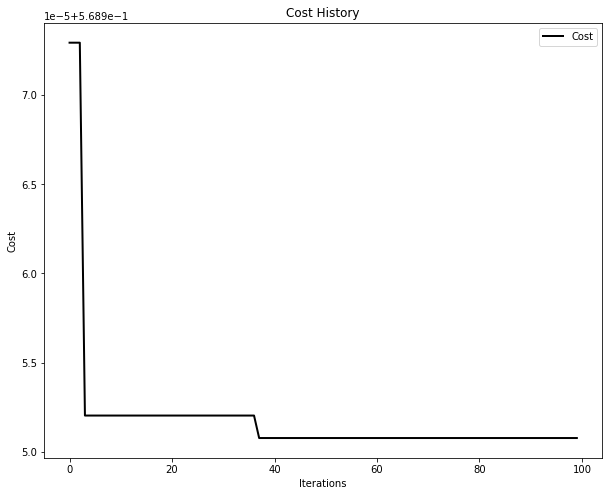

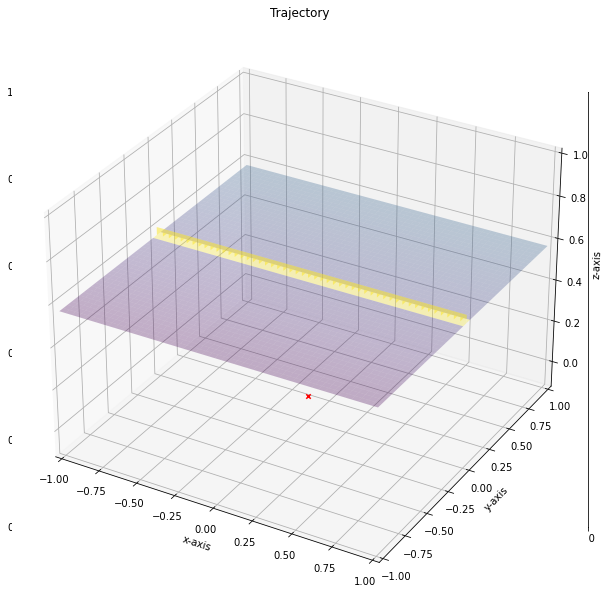

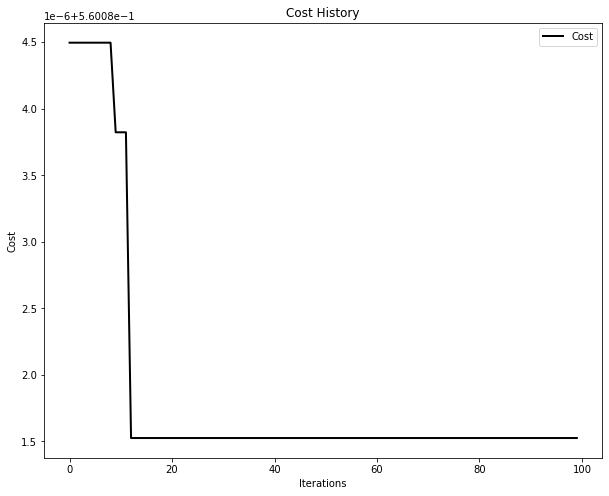

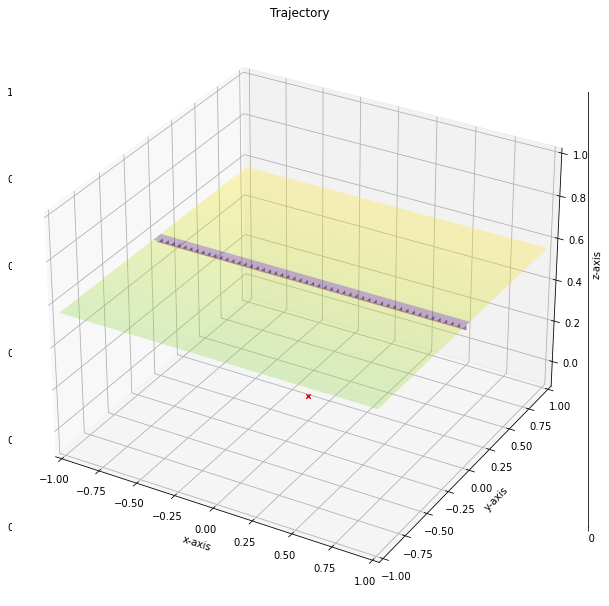

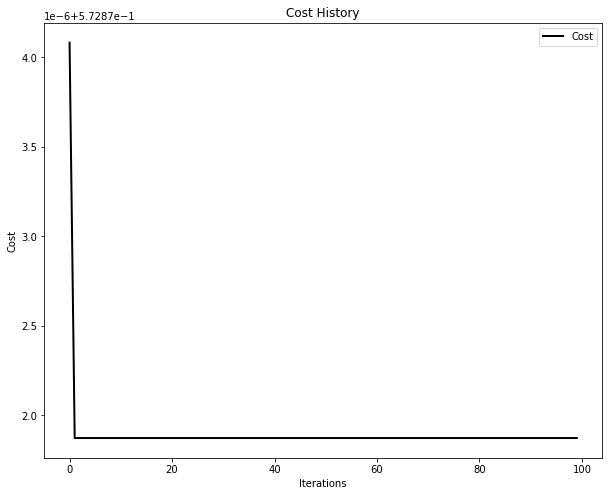

...

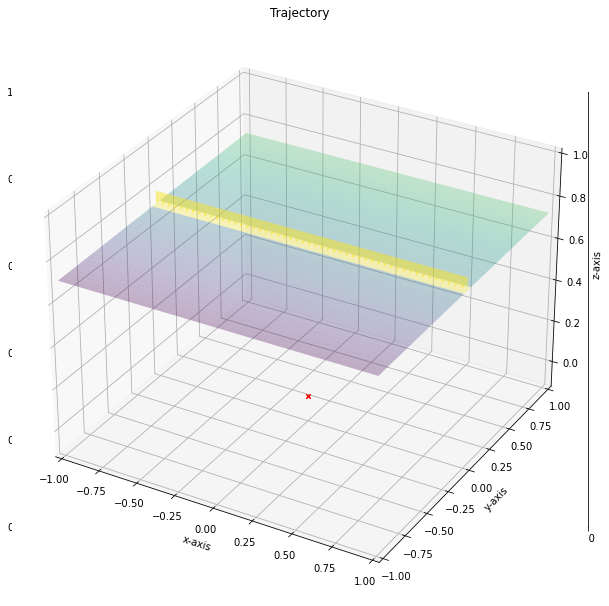

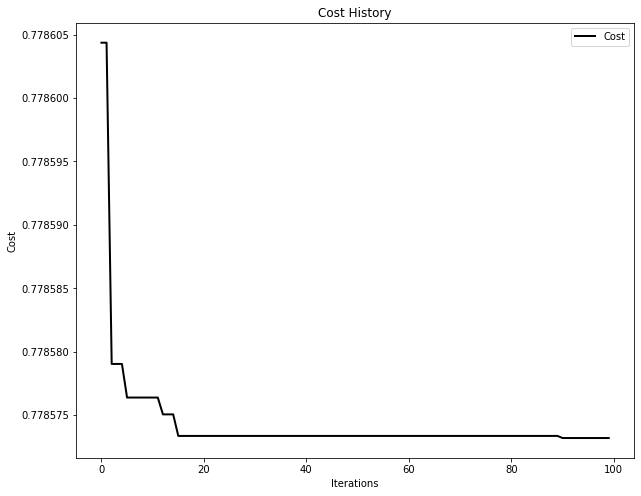

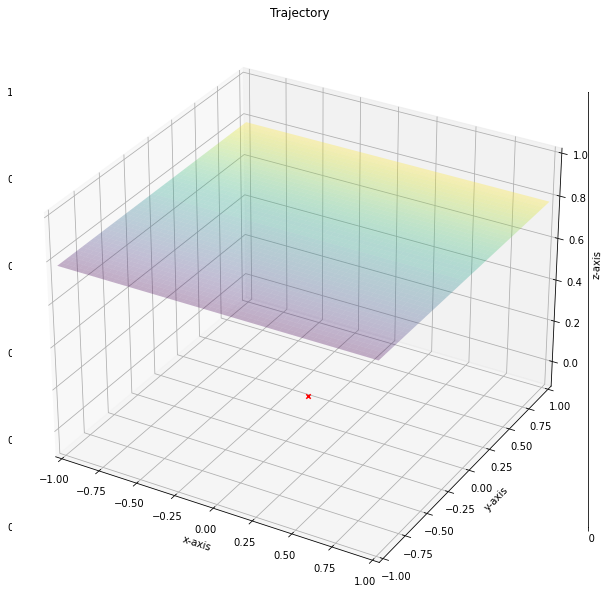

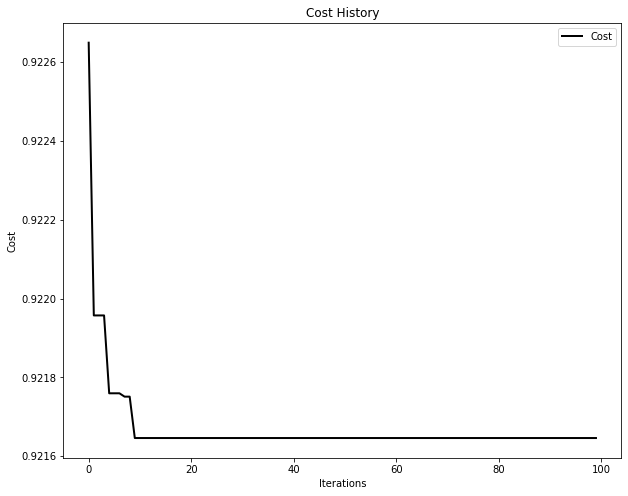

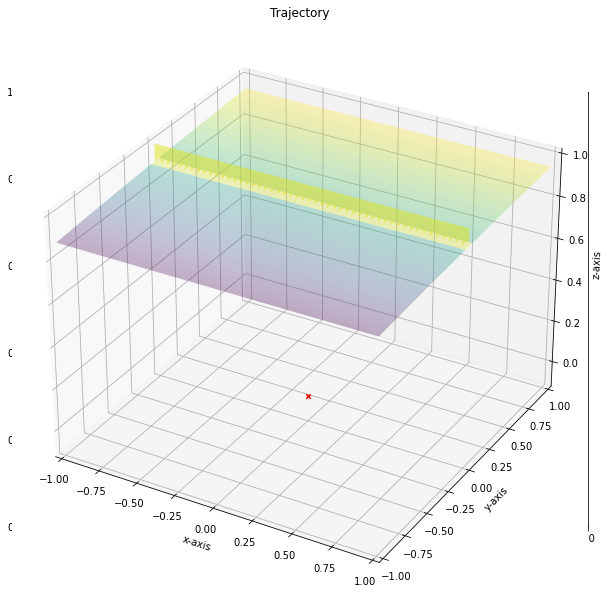

In [37]:
c1 = 0.6
c2 = 0.3
w = 0.9
alpha =0.1

# 0-1
c,p = PSO(1,0,c1,c2,w,alpha)
df['1>rho>0'] = p
df['Internationality(1>rho>0)'] = c

# 0.001-0.1
c,p = PSO(0.1,0.001,c1,c2,w,alpha)
df['0.1>rho>0.001'] = p
df['Internationality(0.1>rho>0.001)'] = c

# 0.9-0.99
c,p = PSO(0.99,0.9,c1,c2,w,alpha)
df['0.99>rho>0.9'] = p
df['Internationality(0.99>rho>0.9)'] = c

# 0.101-0.9
c,p = PSO(0.9,0.101,c1,c2,w,alpha)
df['0.9>rho>0.101'] = p
df['Internationality(0.9>rho>0.101)'] = c

# >1
c,p = PSO(999999,1,c1,c2,w,alpha)
df['rho>1'] = p
df['Internationality(rho>1)'] = c

df.to_csv('result/result_alpha_75_unis'+str(alpha)+'.csv',index=False)

In [19]:
df

,Institute,Articles,Articles w/ IC,Total Citations,Parent Country Citations,ICR,NLIQ,cost,rho,Internationality,1>rho>0,Internationality(1>rho>0),0.1>rho>0.001,Internationality(0.1>rho>0.001),0.9>rho>0.101,Internationality(0.9>rho>0.101)
0,AGH University of Science & Technology,29,3.0,54,33,0.306173,0.388889,0.379797,0.101163,0.379797,0.000845,0.345063,0.001030,0.345064,0.101512,0.345312
1,Al Azhar University,5,1.0,74,17,0.666667,0.770270,0.759295,0.101033,0.759295,0.000206,0.716599,0.001021,0.716600,0.101293,0.716788
2,Al-Imam Muhammad Ibn Saud Islamic University,2,0.0,7,2,0.010000,0.714286,0.253318,0.101637,0.253318,0.000141,0.084543,0.001008,0.084710,0.101316,0.106264
3,Alexandria University,5,2.0,46,3,0.583333,0.934783,0.892623,0.101797,0.892623,0.000963,0.738457,0.001052,0.738459,0.101487,0.740523
4,Amity University,3,0.0,3,1,0.010000,0.666667,0.235022,0.101055,0.235022,0.000030,0.081655,0.001021,0.081834,0.101076,0.101863
5,Amrita Vishwa Vidyapeetham,4,0.0,10,1,0.010000,0.900000,0.317269,0.101051,0.317269,0.000612,0.095015,0.001178,0.095152,0.101105,0.122268
6,Ankara University,3,2.0,12,2,0.284375,0.833333,0.752220,0.101118,0.752220,0.000636,0.486850,0.001223,0.486891,0.102046,0.494032
7,Aoyama Gakuin University,15,0.0,29,6,0.010000,0.793103,0.280722,0.101446,0.280722,0.000269,0.089114,0.001079,0.089286,0.101158,0.113202
8,Arizona State University,80,19.0,558,189,0.387015,0.661290,0.627602,0.101024,0.627602,0.000285,0.505900,0.001034,0.505913,0.101320,0.507737
9,Auburn University,7,1.0,52,7,1.000000,0.865385,0.878071,0.101098,0.878071,0.000515,0.930262,0.001000,0.930263,0.101457,0.930507


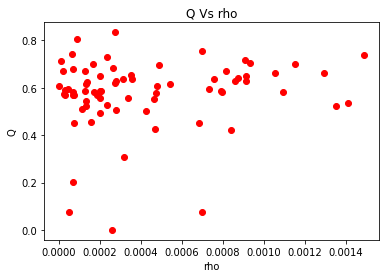

In [37]:
temp =df
temp = temp.sort_values(by=['1>rho>0'])
#print(temp)
x = temp['1>rho>0']
y = temp['Internationality(1>rho>0)']

fig=plt.figure()
#ax=fig.add_axes([0,0,1,1])
plt.scatter(x, y, color='r')

plt.xlabel('rho')
plt.ylabel("Q")
plt.title('Q Vs rho')
plt.savefig('graphs/qVSrho.png')



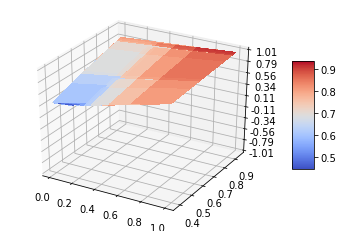

In [469]:
fig = plt.figure()
ax = fig.gca(projection='3d')

# Make data.
X = temp['ICR']
#X = np.arange(-5, 5, 1)
Y = temp['NLIQ']
#Y = np.arange(-5, 5, 1)
X, Y = np.meshgrid(X, Y)
R = np.sqrt(X**2 + Y**2)
Z = np.sin(R)
print()
# Plot the surface.
surf = ax.plot_surface(X, Y, Z, cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)

# Customize the z axis.
ax.set_zlim(-1.01, 1.01)
ax.zaxis.set_major_locator(LinearLocator(10))
ax.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))

# Add a color bar which maps values to colors.
fig.colorbar(surf, shrink=0.5, aspect=5)

plt.show()

# Graphs for different ranges of rho

In [410]:
r = (0.00001,1)

In [472]:
i = r[0]
rho = []
inter = []
Q1 =[]
Q1_new=[]
k=df['ICR'][4]
l=df['NLIQ'][4]
q.setparams(K=k,L=l)
while i<r[1]:
    inter.append(q.Q(i))
    Q1.append(q.Q1(i))
    Q1_new.append(q.Q1_new(i))
    rho.append(i)
    i+=.001

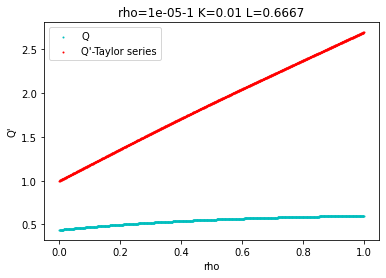

In [473]:
x = rho
y = inter

fig=plt.figure()
#ax=fig.add_axes([0,0,1,1])
plt.scatter(x, y, color='c',s=1,label='Q')
plt.scatter(x, Q1, color='r',s=1,label='Q\'-Taylor series')
#plt.scatter(x, Q1_new, color='g',s=1,label='Q\'-Chain Rule')
plt.xlabel('rho')
plt.ylabel("Q\'")
plt.legend()
plt.title('rho='+str(r[0])+'-'+str(r[1]) +' K='+ str(round(k,4))+' L='+ str(round(l,4)))
plt.savefig('graphs/'+str(round(k,2))+'-'+str(round(l,2))+'.png')

In [454]:
temp

,Institute,Articles,Articles w/ IC,Total Citations,Parent Country Citations,ICR,NLIQ,Ranking,cost,rho,Internationality(1>rho>0),Internationality(0.1>rho>0.001),Internationality(0.99>rho>0.9),Internationality(0.9>rho>0.101),Internationality(rho>1)
9,Auburn University,7,1,52,7,1.000000,0.865385,0.0,0.972104,81.382115,0.877988,0.877988,0.878757,0.878071,0.972104
35,University of British Columbia,85,26,1642,147,0.375978,0.910475,52.0,0.000000,32750.036931,0.833417,0.833438,0.855123,0.836306,0.000000
49,Yonsei University,41,5,250,66,0.243333,0.736000,0.0,0.000000,41484.489355,0.658899,0.658922,0.684608,0.662475,0.000000
10,Australian National University,56,20,1901,137,0.492913,0.927933,41.0,0.000000,42614.120342,0.871081,0.871065,0.883283,0.872608,0.000000
23,Indian Institute of Technology (IIT) - Madras,37,7,329,53,0.557143,0.838906,177.0,0.000000,45084.598449,0.805265,0.805271,0.810235,0.805872,0.000000
20,Indian Institute of Technology (IIT) - Bombay,11,0,230,20,0.010000,0.913043,0.0,0.000000,118926.313562,0.581702,0.581931,0.813900,0.631304,0.000000
36,University of Edinburgh,83,34,860,51,0.280757,0.940698,30.0,0.000000,135708.363613,0.833565,0.833619,0.871647,0.838991,0.000000
12,Benemerita Universidad Autonoma de Puebla,15,2,45,14,0.270833,0.688889,0.0,0.000000,144665.339288,0.627489,0.627512,0.645523,0.629917,0.000000
6,Ankara University,3,2,12,2,0.284375,0.833333,0.0,0.000000,158454.860528,0.748396,0.748426,0.776126,0.752226,0.000000
11,Babes Bolyai University from Cluj,7,2,28,5,0.322917,0.821429,0.0,0.000000,162705.982772,0.748227,0.748237,0.769719,0.751114,0.000000
